<center>

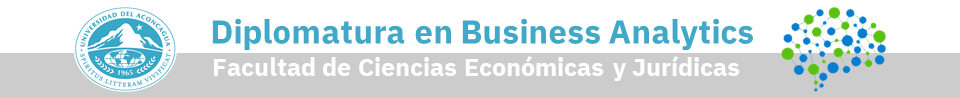

</center>

<center>
<font color="#41a8c7">
<h2><b>
Trabajo Final Módulo 10

</font>
</center>

~~~
Pablo Ariel Genero
~~~

**Instrucciones del Trabajo Final**

- Desarrollar los puntos necesarios para generar el modelo de regresión.
- Utilice PyCaret.
- Utilice un método de ensamble.
- Puede generar graficos en cualquier instancia del desarrollo.
- Al final del colab, generar una breve conclusión.

# **Carga de módulos y datos necesarios**

In [ ]:
!pip install pycaret

In [2]:
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


In [3]:
import pandas as pd
import numpy as np

In [4]:
import plotly.express as px #Para gráficos usados en el AED
import matplotlib.pyplot as plt
import seaborn as sns #Para gráfica de matriz de correlación

# **Creación del DataFrame**

In [5]:
datos = "https://raw.githubusercontent.com/LucaAPiattelli/Diplomatura_Business_Analytics_UDA/main/Modulo_10_Regresion/propiedades.csv"
df = pd.read_csv(datos)
df

,id,l1,l2,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price
0,0,Argentina,Capital Federal,Palermo,2.0,1.0,1.0,80.0,NaN,235000
1,1,Argentina,Capital Federal,Belgrano,NaN,NaN,1.0,NaN,40.0,105000
2,2,Argentina,Capital Federal,San Telmo,1.0,NaN,1.0,34.0,31.0,109183
3,3,Argentina,Capital Federal,Villa Urquiza,2.0,NaN,1.0,NaN,51.0,110000
4,4,Argentina,Capital Federal,Belgrano,6.0,4.0,2.0,190.0,178.0,550000
...,...,...,...,...,...,...,...,...,...,...
44673,44673,Argentina,Capital Federal,Monte Castro,2.0,1.0,1.0,56.0,54.0,115000
44674,44674,Argentina,Capital Federal,Barrio Norte,2.0,1.0,1.0,NaN,NaN,105000
44675,44675,Argentina,Capital Federal,Colegiales,2.0,1.0,1.0,45.0,40.0,99000
44676,44676,Argentina,Capital Federal,Colegiales,1.0,1.0,1.0,59.0,59.0,105000


- l1 - país
- l2 - provincia o ciudad
- l3 - barrio
- rooms - cantidad de habitaciones
- bedrooms - cantidad de dormitorios
- bathrooms - cantidad de baños
- surface_total - superficie total
- surface_covered - superficie cubierta
- price - precio

# **Generación del modelo de regresión**

## ✅ ***Análisis exploratorio de los datos***

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44678 entries, 0 to 44677
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               44678 non-null  int64  
 1   l1               44678 non-null  object 
 2   l2               44678 non-null  object 
 3   l3               44382 non-null  object 
 4   rooms            43547 non-null  float64
 5   bedrooms         38623 non-null  float64
 6   bathrooms        43371 non-null  float64
 7   surface_total    39856 non-null  float64
 8   surface_covered  40641 non-null  float64
 9   price            44678 non-null  int64  
dtypes: float64(5), int64(2), object(3)
memory usage: 3.4+ MB


In [7]:
df.isnull().sum().sort_values(ascending=False)

bedrooms           6055
surface_total      4822
surface_covered    4037
bathrooms          1307
rooms              1131
l3                  296
price                 0
l2                    0
l1                    0
id                    0
dtype: int64

In [8]:
print("Revisando importancia de valores nulos")
print(" bedrooms -------→ ", round(6055/44678,2))
print(" surface_total --→ ", round(4822/44678,2))
print(" surface_covered → ", round(4037/44678,2))
print(" bathrooms ------→ ", round(1307/44678,2))
print(" rooms ----------→ ", round(1131/44678,2))
print(" l3 -------------→ ", round(296/44678,2))

Revisando importancia de valores nulos
 bedrooms -------→  0.14
 surface_total --→  0.11
 surface_covered →  0.09
 bathrooms ------→  0.03
 rooms ----------→  0.03
 l3 -------------→  0.01


### 1️⃣ **Variables Numéricas**

In [9]:
round(df.select_dtypes(include=["float64", "int64"]).describe(),2)

,id,rooms,bedrooms,bathrooms,surface_total,surface_covered,price
count,44678.00,43547.00,38623.00,43371.00,39856.00,40641.00,44678.00
mean,22338.50,2.71,1.98,1.53,90.72,79.21,278897.12
std,12897.57,1.35,1.64,0.86,333.83,222.80,390234.53
min,0.00,1.00,0.00,1.00,10.00,1.00,0.00
25%,11169.25,2.00,1.00,1.00,44.00,40.00,108000.00
50%,22338.50,3.00,2.00,1.00,65.00,57.00,161000.00
75%,33507.75,3.00,3.00,2.00,100.00,90.00,289000.00
max,44677.00,35.00,153.00,18.00,43000.00,43000.00,21400000.00


El análisis descriptivo de las variables numéricas devuelve un valor máximo que a priori podría considerar como atipico: 35 habitaciones, 153 dormitorios, 18 baños y una superficie y precio muy superior a la media. Debería verificar si todo corresponde a la misma propiedad. De ser así, evaluar si conviene exlcuirla. Posiblemente es un hotel o un edificio de departamentos. Si el objetivo del análisis es trabajar sobre los precios/valores de la propiedades individualmente, este tipo de propiedad no sería equivalente al resto. Es decir, es un inmueble, pero tiene caracterísitcas propias muy diferentes al resto. Igualmente debería averiguar un poco más porque estoy suponiendo.

📌 **Visualizando la variable *rooms***:

A continuación, filtro el DF por la variable *rooms* para aquellos casos mayores a 12 habitaciones, y se pueden ver algunas cosas interesantes. El caso de 35 *rooms* no tiene datos para *bedrooms*, tiene sólo 1 *bathroom* y la superficie/precio son relativamente pequeños en relación a otros similares.
La cantidad de casos no son muchos si consideramos el total de datos en el DF, pero podría ser un elemento a tener en cuenta si se quisiera buscar una mejora en el rendimiento del modelo. Habría que revisar que impacto tienen en el modelo.

In [10]:
df.groupby("rooms").count()

,id,l1,l2,l3,bedrooms,bathrooms,surface_total,surface_covered,price
rooms,,,,,,,,,
1.0,8116,8116,8116,8049,3428,7885,7204,7389,8116
2.0,12643,12643,12643,12554,12288,12402,11311,11502,12643
3.0,12005,12005,12005,11925,11782,11769,10812,10971,12005
4.0,7561,7561,7561,7524,7457,7469,6911,7020,7561
5.0,2016,2016,2016,2009,1995,1983,1843,1885,2016
6.0,682,682,682,680,675,677,630,633,682
7.0,271,271,271,269,269,268,250,256,271
8.0,137,137,137,135,135,137,124,129,137
9.0,62,62,62,61,59,61,61,62,62


In [11]:
df_rooms = df[df.rooms>12]
df_rooms

,id,l1,l2,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price
1601,1601,Argentina,Capital Federal,Congreso,22.0,21.0,NaN,600.0,600.0,850000
2120,2120,Argentina,Capital Federal,Monserrat,15.0,14.0,4.0,270.0,265.0,300000
7343,7343,Argentina,Capital Federal,Retiro,14.0,6.0,6.0,437.0,437.0,1400000
10070,10070,Argentina,Capital Federal,San Telmo,14.0,10.0,5.0,400.0,320.0,360000
16889,16889,Argentina,Capital Federal,Belgrano,20.0,1.0,1.0,67.0,NaN,150000
22582,22582,Argentina,Capital Federal,Recoleta,14.0,6.0,2.0,297.0,NaN,690000
30142,30142,Argentina,Capital Federal,Recoleta,14.0,8.0,4.0,485.0,425.0,1650000
34279,34279,Argentina,Capital Federal,San Telmo,16.0,16.0,18.0,NaN,943.0,1300000
42160,42160,Argentina,Capital Federal,Caballito,30.0,2.0,2.0,79.0,79.0,230000
43745,43745,Argentina,Capital Federal,Parque Chacabuco,35.0,NaN,1.0,37.0,33.0,67000


In [12]:
fig_rooms = px.histogram(df, x = df.rooms,
                   title="Distribución variable rooms", 
                   color_discrete_sequence = ["lightblue"])
fig_rooms.show()

📌 **Visualizando la variable *bedrooms***:

Hago el mismo análisis para *bedrooms* y se puede ver que los valores más altos son 153 y 77, con 2 casos por cada uno. Estos no poseen datos en el resto de las variables que nos interesan, excepto por el precio, en donde es el mismo en cada caso. ¿Conviene eliminar o rellenar esas filas del DF?

In [13]:
df.groupby("bedrooms").count()

,id,l1,l2,l3,rooms,bathrooms,surface_total,surface_covered,price
bedrooms,,,,,,,,,
0.0,222,222,222,222,222,213,0,0,222
1.0,15432,15432,15432,15319,15261,15285,13857,14193,15432
2.0,12231,12231,12231,12162,12082,12099,11021,11205,12231
3.0,7951,7951,7951,7914,7818,7902,7260,7403,7951
4.0,2119,2119,2119,2106,2099,2089,1964,2010,2119
5.0,381,381,381,377,377,381,359,367,381
6.0,173,173,173,169,173,171,166,165,173
7.0,36,36,36,36,35,36,33,35,36
8.0,52,52,52,52,52,52,52,52,52


In [14]:
df_bedrooms = df[df.bedrooms>8]
df_bedrooms

,id,l1,l2,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price
1601,1601,Argentina,Capital Federal,Congreso,22.0,21.0,NaN,600.0,600.0,850000
2120,2120,Argentina,Capital Federal,Monserrat,15.0,14.0,4.0,270.0,265.0,300000
3616,3616,Argentina,Capital Federal,NaN,NaN,153.0,NaN,NaN,NaN,300000
3801,3801,Argentina,Capital Federal,NaN,NaN,153.0,NaN,NaN,NaN,300000
4463,4463,Argentina,Capital Federal,NaN,NaN,77.0,NaN,NaN,NaN,135000
4530,4530,Argentina,Capital Federal,NaN,NaN,77.0,NaN,NaN,NaN,135000
10070,10070,Argentina,Capital Federal,San Telmo,14.0,10.0,5.0,400.0,320.0,360000
10420,10420,Argentina,Capital Federal,Barrio Norte,9.0,12.0,8.0,715.0,612.0,2890000
11689,11689,Argentina,Capital Federal,Villa Crespo,3.0,22.0,2.0,NaN,60.0,240000
13055,13055,Argentina,Capital Federal,Saavedra,3.0,13.0,3.0,105.0,94.0,435000


In [15]:
fig_bedrooms = px.histogram(df, x = df.bedrooms,
                   title="Distribución variable bedrooms", 
                   color_discrete_sequence = ["lightblue"])
fig_bedrooms.show()

📌 **Visualizando la variable *bathrooms***:

In [16]:
df.groupby("bathrooms").count()

,id,l1,l2,l3,rooms,bedrooms,surface_total,surface_covered,price
bathrooms,,,,,,,,,
1.0,27801,27801,27801,27642,27348,22882,24886,25468,27801
2.0,10450,10450,10450,10383,10280,10306,9514,9638,10450
3.0,3435,3435,3435,3413,3408,3399,3154,3197,3435
4.0,1175,1175,1175,1167,1161,1158,1098,1100,1175
5.0,407,407,407,407,404,402,389,391,407
6.0,74,74,74,74,74,74,69,68,74
7.0,17,17,17,17,17,17,16,16,17
8.0,6,6,6,6,6,6,5,5,6
9.0,3,3,3,3,3,1,3,3,3


In [17]:
df_bathrooms = df[df.bathrooms>7]
df_bathrooms

,id,l1,l2,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price
158,158,Argentina,Capital Federal,Palermo,11.0,8.0,8.0,593.0,587.0,2550000
1753,1753,Argentina,Capital Federal,Belgrano,12.0,8.0,8.0,296.0,260.0,1100000
3215,3215,Argentina,Capital Federal,Belgrano,8.0,5.0,8.0,NaN,NaN,1500000
10420,10420,Argentina,Capital Federal,Barrio Norte,9.0,12.0,8.0,715.0,612.0,2890000
15279,15279,Argentina,Capital Federal,Belgrano,3.0,2.0,10.0,74.0,68.0,365000
16911,16911,Argentina,Capital Federal,Congreso,7.0,7.0,9.0,503.0,495.0,400000
18763,18763,Argentina,Capital Federal,Monserrat,9.0,NaN,9.0,503.0,503.0,400000
18965,18965,Argentina,Capital Federal,San Nicolás,9.0,NaN,9.0,503.0,503.0,400000
25190,25190,Argentina,Capital Federal,San Nicolás,1.0,1.0,11.0,23.0,NaN,59000
32119,32119,Argentina,Capital Federal,Palermo,10.0,5.0,8.0,602.0,384.0,2000000


In [18]:
fig_bathrooms = px.histogram(df, x = df.bathrooms,
                   title="Distribución variable bathrooms", 
                   color_discrete_sequence = ["lightblue"])
fig_bathrooms.show()

### 2️⃣ **Variables No Numéricas**

In [19]:
df.l1.value_counts()

Argentina    44678
Name: l1, dtype: int64

In [20]:
df.l2.value_counts()

Capital Federal    44678
Name: l2, dtype: int64

In [21]:
df.l3.value_counts()

Palermo                 8569
Belgrano                5287
Recoleta                3699
Caballito               2817
Villa Urquiza           1981
Barrio Norte            1951
Almagro                 1868
Villa Crespo            1741
Nuñez                   1602
Puerto Madero           1529
Flores                  1083
Balvanera                924
Colegiales               827
Saavedra                 691
San Telmo                654
San Nicolás              654
Retiro                   631
Villa del Parque         557
San Cristobal            552
Villa Devoto             515
Barracas                 497
Boedo                    489
Floresta                 448
Monserrat                398
Congreso                 363
Coghlan                  354
Parque Chacabuco         314
Villa Pueyrredón         277
Chacarita                275
Liniers                  261
Villa Luro               250
Paternal                 201
Once                     195
Boca                     190
Parque Patrici

La variable que correponde a los barrios tiene una gran cantidad de valores o clases. En cuanto a valores nulos, vimos que posee un total de 296, que no debería presentar problema para tratarlos.

Una opción que creo puede ayudar en el desarrollo del modelo, es crear una nueva variable que agrupe a los barrios por zonas geográficas (Norte, Sur, Este, Oeste). Esa nueva variable podría reemplazar a *l3* y así reducir la dimensionalidad, o también conservarse como una nueva variable.

## ✅ ***Preprocesamiento de los datos***

### 1️⃣ **Variable Zonas**



Tal como se vio al analizar las variables de tipo no numérico, se puede generar una variable que agrupe los barrios por zona, ya que eso puede ayudar a reducir la dimensionalidad de la variable. Además, teniendo en cuenta la pregunta de negocio, puede ser de utilidad contar con este dato.

Para poder hacer la clasificación se toma la siguiente información:

>*https://www.estadisticaciudad.gob.ar/eyc/wp-content/uploads/2012/01/DT011206-ID.jpg*

In [22]:
def zona(l3):
  if l3 in ["Palermo","Belgrano","Recoleta","Barrio Norte","Nuñez","Colegiales","Las Cañitas"]:
    return ("Norte")
  elif l3 in ["Caballito","Villa Urquiza","Almagro","Villa Crespo","Flores","Saavedra","Villa del Parque",
              "Villa Devoto","Boedo","Coghlan","Parque Chacabuco","Villa Pueyrredón","Chacarita","Paternal",
              "Villa Ortuzar","Villa Santa Rita","Villa General Mitre","Agronomía","Parque Centenario","Parque Chas"]:
    return ("Centro Oeste")
  elif l3 in ["Puerto Madero","Balvanera","San Nicolás","San Telmo","Retiro","San Cristobal","Monserrat",
              "Congreso","Once","Constitución","Tribunales","Abasto","Centro / Microcentro","Catalinas"]:
    return ("Centro Este")
  else: 
    return ("Sur")

In [23]:
df["zona"] = df.l3.apply(zona)
df

,id,l1,l2,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,zona
0,0,Argentina,Capital Federal,Palermo,2.0,1.0,1.0,80.0,NaN,235000,Norte
1,1,Argentina,Capital Federal,Belgrano,NaN,NaN,1.0,NaN,40.0,105000,Norte
2,2,Argentina,Capital Federal,San Telmo,1.0,NaN,1.0,34.0,31.0,109183,Centro Este
3,3,Argentina,Capital Federal,Villa Urquiza,2.0,NaN,1.0,NaN,51.0,110000,Centro Oeste
4,4,Argentina,Capital Federal,Belgrano,6.0,4.0,2.0,190.0,178.0,550000,Norte
...,...,...,...,...,...,...,...,...,...,...,...
44673,44673,Argentina,Capital Federal,Monte Castro,2.0,1.0,1.0,56.0,54.0,115000,Sur
44674,44674,Argentina,Capital Federal,Barrio Norte,2.0,1.0,1.0,NaN,NaN,105000,Norte
44675,44675,Argentina,Capital Federal,Colegiales,2.0,1.0,1.0,45.0,40.0,99000,Norte
44676,44676,Argentina,Capital Federal,Colegiales,1.0,1.0,1.0,59.0,59.0,105000,Norte


In [24]:
fig_zona = px.histogram(df, x = df.zona,
                   title="Distribución variable Zona", 
                   color_discrete_sequence = ["lightblue"])
fig_zona.show()

### 2️⃣ **Eliminar variables**

Las variables *l1* y *l2* no aportan información de interés, ya que se repite el mismo valor, por lo que se va a eliminar:

In [25]:
df.drop(columns=(["l1","l2"]),axis=1, inplace=True)

In [26]:
df.head()

,id,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,zona
0,0,Palermo,2.0,1.0,1.0,80.0,NaN,235000,Norte
1,1,Belgrano,NaN,NaN,1.0,NaN,40.0,105000,Norte
2,2,San Telmo,1.0,NaN,1.0,34.0,31.0,109183,Centro Este
3,3,Villa Urquiza,2.0,NaN,1.0,NaN,51.0,110000,Centro Oeste
4,4,Belgrano,6.0,4.0,2.0,190.0,178.0,550000,Norte


### 3️⃣ **Eliminar valores**



> #### Valores atípicos



Al momento de analizar las variables numéricas, se vió que había algunos valores anormales en *bedrooms*, por lo que voy a eliminarlos, porque no tienen datos en el resto de las variables de interés. Los identifico y luego los elimino según el index:

In [27]:
df[df.bedrooms>69] #Filtro bedrooms para buscarl los más altos

,id,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,zona
3616,3616,NaN,NaN,153.0,NaN,NaN,NaN,300000,Sur
3801,3801,NaN,NaN,153.0,NaN,NaN,NaN,300000,Sur
4463,4463,NaN,NaN,77.0,NaN,NaN,NaN,135000,Sur
4530,4530,NaN,NaN,77.0,NaN,NaN,NaN,135000,Sur


In [28]:
df=df.drop(axis=0,index=[3616,3801,4463,4530])

Verificar si han sido eliminados, buscando por valor y luego verificarndo el tamaño del DF (tiene 4 registros menos):

In [29]:
df[df.bedrooms>69]

,id,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,zona


In [30]:
df.shape

(44674, 9)

> #### Valores nulos

Voy a revisar los registros que presenten la mayoría de los campos con valores NaN. Para esos casos considero que es más apropiado eliminar esos registros que reemplazarlos con otros métodos:

In [31]:
#Todo Nulo salvo el precio
df[pd.isnull(df.surface_total)
  &pd.isnull(df.surface_covered)
  &pd.isnull(df.rooms)
  &pd.isnull(df.bedrooms)
  &pd.isnull(df.bathrooms)
  &pd.isnull(df.l3)]

,id,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,zona
7576,7576,NaN,NaN,NaN,NaN,NaN,NaN,83000,Sur


In [32]:
df=df.drop(axis=0,index=[7576])

In [33]:
#Todo Nulo salvo el precio y la locación
nulos = df[pd.isnull(df.surface_total)
  &pd.isnull(df.surface_covered)
  &pd.isnull(df.rooms)
  &pd.isnull(df.bedrooms)
  &pd.isnull(df.bathrooms)]

nulos

,id,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,zona
47,47,Mataderos,NaN,NaN,NaN,NaN,NaN,90000,Sur
52,52,Villa Luro,NaN,NaN,NaN,NaN,NaN,90000,Sur
179,179,Liniers,NaN,NaN,NaN,NaN,NaN,160000,Sur
190,190,Belgrano,NaN,NaN,NaN,NaN,NaN,550000,Norte
193,193,Mataderos,NaN,NaN,NaN,NaN,NaN,160000,Sur
...,...,...,...,...,...,...,...,...,...
42951,42951,Parque Avellaneda,NaN,NaN,NaN,NaN,NaN,150000,Sur
42952,42952,Parque Avellaneda,NaN,NaN,NaN,NaN,NaN,152000,Sur
42965,42965,Villa Luro,NaN,NaN,NaN,NaN,NaN,29000,Sur
44555,44555,Villa Lugano,NaN,NaN,NaN,NaN,NaN,45000,Sur


In [34]:
nulos=nulos.index #Guardo el index de los valores nulos para eliminarlos
df=df.drop(axis=0,index=nulos)

In [35]:
#Compruebo que se hayan quitado
df[pd.isnull(df.surface_total)
  &pd.isnull(df.surface_covered)
  &pd.isnull(df.rooms)
  &pd.isnull(df.bedrooms)
  &pd.isnull(df.bathrooms)]

,id,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,zona


### 4️⃣ **Tratamiento de valores nulos**

Después de haber eliminado algunos de los valores nulos del set de datos, voy a proceder a rellenar los restantes que aún quedan en nuestro DF. Para eso primero verifico como quedó la distribución de los NaN, que es similar a como se vió más arriba, pero con una cantidad inferior (se borrar aprox. 300 registros que contenian nulos).

In [36]:
df.isnull().sum().sort_values(ascending=False)

bedrooms           5749
surface_total      4512
surface_covered    3727
bathrooms           997
rooms               821
l3                  291
zona                  0
price                 0
id                    0
dtype: int64

>#### Variable *surface_total*

En este caso tomo el criterio para rellenar los valores NaN donde considero que la superficie total no puede ser inferior a la superficie cubierta. Para ello en lugar de usar algún método como el promedio u otro, voy a rellenar los valores de la variable con el mismo valor que se muestra en *surface_covered*. Creo que es lo más apropiado ya que el fin es evitar que quede con un valor de superficie total inferior al espacio cubierto.

Primero filtro el DF para los valores nulos en *surface_total* y valores no nulos en *surface_covered*. Luego creo un sub data frame llamado ***$st$*** con los valores de esta última variable a la cual le cambio el nombre por *surface total* , para usarlo como update del df original (entonces así se van a reemplazar los NaN de *surface_total*). 

In [37]:
st=df[pd.isnull(df.surface_total)
  &pd.notnull(df.surface_covered)] #Nulos en surface_total / No nulos en surface_covered

st=st[["id","surface_covered"]]
st=st.rename(columns={"surface_covered":"surface_total"})
st

,id,surface_total
1,1,40.0
3,3,51.0
19,19,123.0
20,20,35.0
39,39,47.0
...,...,...
44629,44629,67.0
44638,44638,65.0
44650,44650,31.0
44662,44662,54.0


In [38]:
df.update(st)

Luego del update del DF aún quedan 1829 valos NaN en la variable *Surface_total*. Para rellenarlos en esta caso voy a tomar el valor promedio de la superficie en cada *zona*, y mediante una función llamada *total* voy a rellenar los NaN con el promedio del tamaño de cada zona:

In [39]:
df.surface_total.isnull().sum()

1829

In [40]:
round((df.groupby("zona").mean().filter(["surface_total"])),2)

,surface_total
zona,
Centro Este,100.19
Centro Oeste,66.47
Norte,103.08
Sur,68.46


In [41]:
def total(zona):
  if zona is "Centro Este":
    return (100.19)
  elif zona is "Centro Oeste":
    return (66.47)
  elif zona in "Norte":
    return (103.08)
  else: 
    return (68.46)

In [42]:
st=df[pd.isnull(df.surface_total)]
st["surface_total"] = st.zona.apply(total)
st=st.surface_total
#En el objeto st aplico la función total para cargar los valores zona

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [43]:
df.update(st) #Update del DF

In [44]:
df.surface_total.isnull().sum() #Compruebo que no hay mas nulos para surface_total

0

>#### Variable *surface_covered*

Para rellenar la variable *surface_covered* voy a calcular el porcentaje cubierto promedio de las propiedades, y en base a ese porcentaje rellenar los valores NaN la variable:

In [45]:
round(df[["surface_total","surface_covered"]].mean(),2)

surface_total      89.27
surface_covered    79.21
dtype: float64

In [46]:
print(("Porcentaje de la superficie total cubierto"),round(79.21/89.27,2))

Porcentaje de la superficie total cubierto 0.89


In [47]:
sc=df[pd.notnull(df.surface_total)
  &pd.isnull(df.surface_covered)] #Nulos en surface_covered / No nulos en surface_total

sc=sc[["id","surface_total"]] #sub DF que contiene los valores del surface_total cuando covered es nulo
sc.insert(2,column="surface_covered",value=sc.surface_total*0.88) #calculo surface_covered a partir de surface_total
sc=sc[["id","surface_covered"]]
sc

,id,surface_covered
0,0.0,70.4000
5,5.0,211.2000
6,6.0,211.2000
27,27.0,90.7104
35,35.0,211.2000
...,...,...
44602,44602.0,67.7600
44610,44610.0,67.7600
44627,44627.0,32.5600
44646,44646.0,60.2448


In [48]:
df.update(sc)

In [49]:
df.isnull().sum().sort_values(ascending=False) 

bedrooms           5749
bathrooms           997
rooms               821
l3                  291
zona                  0
price                 0
surface_covered       0
surface_total         0
id                    0
dtype: int64

>#### Resto de variables

Para poder rellenar las restantes variables, aplico el mismo análisis que en *surface_total* donde revisé por *zona* el promedio de la variable.

En primer lugar lo hago con *bathrooms*, donde el promedio es similar en todas las zonas:

In [50]:
round((df.groupby("zona").mean().filter(["rooms","bedrooms","bathrooms"])),2)

,rooms,bedrooms,bathrooms
zona,,,
Centro Este,2.67,1.95,1.59
Centro Oeste,2.42,1.75,1.30
Norte,2.93,2.13,1.69
Sur,2.52,1.79,1.25


In [51]:
df.bedrooms.replace({np.nan: 2}, inplace=True) #np.nan equivale a los NaN segun documentación sklearn

Luego trabajo con rooms donde el promedio es 3 salvo para Centro Oeste que es 2 (valores redondeados):

In [52]:
def room(zona):
  if zona is "Centro Oeste":
    return (2)
  else: 
    return (3)

In [53]:
r=df[pd.isnull(df.rooms)]
r["rooms"] = r.zona.apply(room)
r=r.rooms

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [54]:
df.update(r)

Rellenando *bathrooms*, según el cuadro con promedios de más arriba:

In [55]:
def bathroom(zona):
  if zona is "Centro Este":
    return (2)
  elif zona is "Centro Oeste":
    return (1)
  elif zona in "Norte":
    return (2)
  else: 
    return (1)

In [56]:
b=df[pd.isnull(df.bathrooms)]
b["bathrooms"] = b.zona.apply(room)
b=b.bathrooms

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [57]:
df.update(b)

Por último, para la variable *l3* que representa las locaciones individuales voy a eliminar los registros NaN, ya que no son muchos en relacion al tamaño del DF y considerando la alta dimensionalidad de la variable. También elimino la variable id que replica el valor del index y no aporta datos (la conserve hasta este punto por si se necesitaba con anterioridad):

In [58]:
df.dropna(how="any", inplace=True)
df.head()

,id,l3,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,zona
0,0.0,Palermo,2.0,1.0,1.0,80.0,70.4,235000,Norte
1,1.0,Belgrano,3.0,2.0,1.0,40.0,40.0,105000,Norte
2,2.0,San Telmo,1.0,2.0,1.0,34.0,31.0,109183,Centro Este
3,3.0,Villa Urquiza,2.0,2.0,1.0,51.0,51.0,110000,Centro Oeste
4,4.0,Belgrano,6.0,4.0,2.0,190.0,178.0,550000,Norte


In [59]:
df.reset_index(drop=True, inplace=True)

Compruebo la existencia de valores NaN:

In [60]:
df.isnull().sum().sort_values(ascending=False)

zona               0
price              0
surface_covered    0
surface_total      0
bathrooms          0
bedrooms           0
rooms              0
l3                 0
id                 0
dtype: int64

In [61]:
df.drop(columns=(["id"]),axis=1, inplace=True)

Reordeno las variables:

In [62]:
df = df[['l3',
         'zona', 
         'rooms', 
         'bedrooms', 
         'bathrooms', 
         'surface_total', 
         'surface_covered', 
         'price']]

In [63]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44077 entries, 0 to 44076
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   l3               44077 non-null  object 
 1   zona             44077 non-null  object 
 2   rooms            44077 non-null  float64
 3   bedrooms         44077 non-null  float64
 4   bathrooms        44077 non-null  float64
 5   surface_total    44077 non-null  float64
 6   surface_covered  44077 non-null  float64
 7   price            44077 non-null  int64  
dtypes: float64(5), int64(1), object(2)
memory usage: 2.7+ MB


### 5️⃣ **Codificación de variables**

En PyCaret la codificación de las variables categóricas se hace por un método similar a OneHot, lo que agregaría gran cantidad de variables al modelo y puede afectar su rendimiento. Por eso, decido codificarlas previamente dentro de la misma variable.

In [64]:
from sklearn.preprocessing import LabelEncoder

In [65]:
convertir = LabelEncoder()

In [66]:
df.l3 = convertir.fit_transform(df.l3)
df.zona = convertir.fit_transform(df.zona)

In [67]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44077 entries, 0 to 44076
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   l3               44077 non-null  int64  
 1   zona             44077 non-null  int64  
 2   rooms            44077 non-null  float64
 3   bedrooms         44077 non-null  float64
 4   bathrooms        44077 non-null  float64
 5   surface_total    44077 non-null  float64
 6   surface_covered  44077 non-null  float64
 7   price            44077 non-null  int64  
dtypes: float64(5), int64(3)
memory usage: 2.7 MB


### 6️⃣ **Verificar correlación**

Se realiza la validación de la relación entre las variables del conjunto de datos.

In [68]:
corrMatrix = df.corr(method = 'pearson')

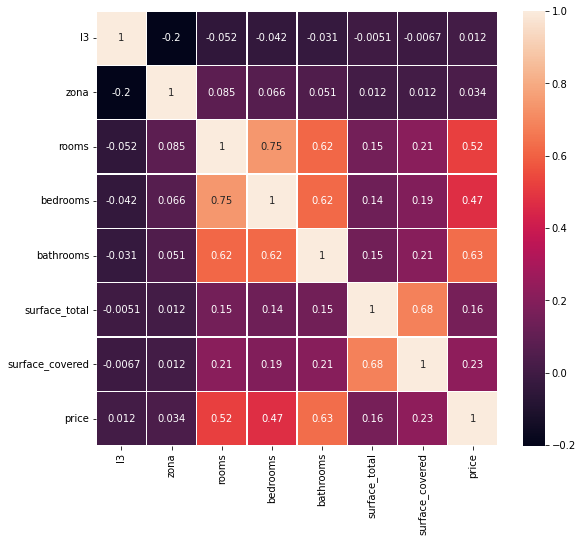

In [69]:
plt.figure(figsize=(9,8))
sns.heatmap(corrMatrix, 
            annot=True,
            linewidths=.5);

La matriz muestra una fuerte correlación entre *bedrooms* y *rooms*, por lo que se procede a revisar la relación lineal entre ambas:

In [70]:
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from scipy import stats

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



In [71]:
X = df.bedrooms
y = df.rooms

In [72]:
X2 = sm.add_constant(X)
est = sm.OLS(y, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                  rooms   R-squared:                       0.556
Model:                            OLS   Adj. R-squared:                  0.556
Method:                 Least Squares   F-statistic:                 5.528e+04
Date:                Sun, 17 Oct 2021   Prob (F-statistic):               0.00
Time:                        20:08:19   Log-Likelihood:                -57405.
No. Observations:               44077   AIC:                         1.148e+05
Df Residuals:                   44075   BIC:                         1.148e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.7986      0.009     86.834      0.0

Las métricas obtenidas muestran cierto grado de relación entre ambas, siendo el R2 obtenido de 0.55, y podría considerarse como una variable a eliminar.

In [73]:
df.drop(columns=(["bedrooms"]),axis=1, inplace=True)

## ✅ ***Modelo de Regresion***

### 1️⃣ **División del conjunto de datos**

In [74]:
data = df.sample(frac=0.75, random_state=0)
data_no_vista = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_no_vista.reset_index(drop=True, inplace=True)

print('Datos de entrenamiento -→ ' + str(data.shape))
print('Datos de testeo --------→ ' + str(data_no_vista.shape))

Datos de entrenamiento -→ (33058, 7)
Datos de testeo --------→ (11019, 7)


### 2️⃣ **Setup del modelo**

In [75]:
from pycaret.regression import *
#Importo TODO lo relacionado a regresión en PyCaret

In [76]:
regresion = setup(data = data, 
                  target = "price", 
                  session_id=0, 
                  log_experiment = True,
                  normalize = True,
                  transformation = True,                   
                  experiment_name = "reg",
                  numeric_features = ['zona']) #Me toma Zona como categórico a pesar de que se codificó

,Description,Value
0,session_id,0
1,Target,price
2,Original Data,"(33058, 7)"
3,Missing Values,False
4,Numeric Features,6
5,Categorical Features,0
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(23140, 6)"


In [77]:
mejor_modelo = compare_models(n_select=3)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,66181.4510,5.298500e+10,205170.2267,0.7474,0.3057,0.2452,0.178
gbr,Gradient Boosting Regressor,70068.8695,5.557207e+10,213418.1587,0.7276,0.3228,0.2674,0.866
knn,K Neighbors Regressor,67989.2076,6.324212e+10,233470.2563,0.6770,0.3040,0.2385,0.116
rf,Random Forest Regressor,60187.3877,6.487662e+10,233356.1868,0.6623,0.2861,0.2228,3.251
et,Extra Trees Regressor,59454.2744,6.813222e+10,242177.9385,0.6341,0.2894,0.2203,2.155
ada,AdaBoost Regressor,112332.2811,9.966526e+10,304490.5366,0.4419,0.4805,0.4870,0.196
lr,Linear Regression,152458.3665,1.093530e+11,320917.5658,0.3873,0.9306,0.7542,0.244
lasso,Lasso Regression,152458.1128,1.093530e+11,320917.5712,0.3873,0.9307,0.7542,0.024
ridge,Ridge Regression,152456.4921,1.093530e+11,320917.5511,0.3873,0.9306,0.7542,0.013
llar,Lasso Least Angle Regression,152398.0750,1.093532e+11,320917.6528,0.3873,0.9257,0.7535,0.016


In [78]:
mejor_modelo

[LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=0, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0),
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                           init=None, learning_rate=0.1, loss='ls', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                    

Se realiza la predicción sobre el conjunto de entrenamiento completo:

In [79]:
entrenamiento=predict_model(mejor_modelo[0], data=data)
round(entrenamiento)

,l3,zona,rooms,bathrooms,surface_total,surface_covered,price,Label
0,26,2,1.0,1.0,51.0,51.0,135000,162032.0
1,3,0,2.0,1.0,32.0,32.0,61000,71337.0
2,1,1,2.0,1.0,59.0,46.0,135000,125234.0
3,22,0,2.0,1.0,90.0,50.0,130000,112071.0
4,9,1,2.0,1.0,37.0,33.0,77000,93940.0
...,...,...,...,...,...,...,...,...
33053,24,2,3.0,1.0,90.0,70.0,198000,253519.0
33054,37,1,3.0,2.0,95.0,86.0,220000,249023.0
33055,24,2,3.0,1.0,48.0,48.0,115000,151680.0
33056,6,2,1.0,1.0,38.0,35.0,118000,111823.0


### 3️⃣ **Evaluación del modelo generado**

In [80]:
evaluate_model(mejor_modelo[0])

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

Se finaliza el modelo y luego se hace la predicción sobre el conjunto de datos no vistos (separados con anterioridad):

In [81]:
modelo_final = finalize_model(mejor_modelo[0])
print(modelo_final)

LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=0, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


In [82]:
datos_test_prediccion = predict_model(modelo_final, data=data_no_vista)
datos_test_prediccion.head()

,l3,zona,rooms,bathrooms,surface_total,surface_covered,price,Label
0,6,2,4.0,2.0,240.0,211.2,750000,853306.379265
1,56,1,1.0,1.0,44.0,41.0,86000,98820.042084
2,53,1,2.0,1.0,73.0,46.0,110000,128429.395924
3,55,1,1.0,1.0,45.0,31.0,99000,109470.722691
4,26,2,4.0,1.0,123.0,123.0,387066,386911.200794


In [83]:
from pycaret.utils import check_metric

In [84]:
datos_total = predict_model(modelo_final, data=df)
datos_total.head()

,l3,zona,rooms,bathrooms,surface_total,surface_covered,price,Label
0,26,2,2.0,1.0,80.0,70.4,235000,236655.852162
1,6,2,3.0,1.0,40.0,40.0,105000,127251.808442
2,40,0,1.0,1.0,34.0,31.0,109183,78104.776514
3,55,1,2.0,1.0,51.0,51.0,110000,139119.342820
4,6,2,6.0,2.0,190.0,178.0,550000,567343.604732


In [85]:
print("R2 datos de testeo ------→", check_metric(datos_test_prediccion['price'], datos_test_prediccion['Label'], metric = "R2"))
print("R2 datos entrenamiento --→", check_metric(entrenamiento['price'], entrenamiento['Label'], metric = "R2"))
print("R2 datos completos --→", check_metric(datos_total['price'], datos_total['Label'], metric = "R2"))

R2 datos de testeo ------→ 0.8372
R2 datos entrenamiento --→ 0.7761
R2 datos completos --→ 0.7952


Por último se revisan las métricas que arroja la ejecución del modelo final sobre los datos completos, los de test y entrenamiento, y se puede ver que la variación no es grande, lo cual es un indicio de que el modelo podría llegar a ser de utilidad.

### 4️⃣ **Ensamble del modelo**

Se procede a correr el ensamble del modelo mejor calificado en base a *R2* que es LGBMRegressor, para lo cual se usa el método Bagging con el parámetros n_estimators en 150:

In [86]:
bagged = ensemble_model(mejor_modelo[0], n_estimators=150)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,72308.9870,1.191638e+11,345201.0734,0.5078,0.3049,0.2370
1,62624.2264,2.777999e+10,166673.3148,0.7945,0.2995,0.2487
2,66078.8208,2.735123e+10,165382.0795,0.8283,0.3109,0.3104
3,66898.4339,3.899908e+10,197481.8397,0.7629,0.3035,0.2471
4,65178.1343,1.994198e+10,141216.0837,0.8606,0.2931,0.2352
5,57877.3881,1.516626e+10,123151.3778,0.8531,0.3788,0.2417
6,62926.5129,1.720326e+10,131161.2044,0.8788,0.2831,0.2318
7,69450.7268,3.455244e+10,185882.8560,0.7946,0.2778,0.2269
8,68710.0490,2.107693e+11,459096.1277,0.3503,0.2827,0.2183
9,61845.6696,1.743881e+10,132056.0863,0.8520,0.2784,0.2287


In [87]:
predict_bagged = predict_model(bagged, data=data)
predict_bagged

,l3,zona,rooms,bathrooms,surface_total,surface_covered,price,Label
0,26,2,1.0,1.0,51.0,51.00,135000,160254.705310
1,3,0,2.0,1.0,32.0,32.00,61000,71364.112619
2,1,1,2.0,1.0,59.0,46.00,135000,128501.203895
3,22,0,2.0,1.0,90.0,50.00,130000,120443.023395
4,9,1,2.0,1.0,37.0,32.56,77000,91601.847062
...,...,...,...,...,...,...,...,...
33053,24,2,3.0,1.0,90.0,70.00,198000,248471.972521
33054,37,1,3.0,2.0,95.0,86.00,220000,248284.777067
33055,24,2,3.0,1.0,48.0,48.00,115000,154724.080778
33056,6,2,1.0,1.0,38.0,35.00,118000,110225.072386


In [88]:
evaluate_model(bagged)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [89]:
bagged_final = finalize_model(bagged)

In [90]:
datos_test_bagged = predict_model(bagged_final, data=data_no_vista)
datos_test_bagged.head()

,l3,zona,rooms,bathrooms,surface_total,surface_covered,price,Label
0,6,2,4.0,2.0,240.0,211.2,750000,831331.460110
1,56,1,1.0,1.0,44.0,41.0,86000,99763.360645
2,53,1,2.0,1.0,73.0,46.0,110000,133928.225582
3,55,1,1.0,1.0,45.0,31.0,99000,109447.219844
4,26,2,4.0,1.0,123.0,123.0,387066,397006.999855


In [91]:
df_bagged = predict_model(bagged_final, data=df)
df_bagged.head()

,l3,zona,rooms,bathrooms,surface_total,surface_covered,price,Label
0,26,2,2.0,1.0,80.0,70.4,235000,244929.605643
1,6,2,3.0,1.0,40.0,40.0,105000,125078.033931
2,40,0,1.0,1.0,34.0,31.0,109183,77721.360446
3,55,1,2.0,1.0,51.0,51.0,110000,130416.585438
4,6,2,6.0,2.0,190.0,178.0,550000,563729.400188


In [92]:
print("R2 Bagged Test---------→", check_metric(datos_test_bagged['price'], datos_test_bagged['Label'], metric = "R2"))
print("R2 Bagged Train -------→", check_metric(predict_bagged['price'], predict_bagged['Label'], metric = "R2"))
print("R2 Bagged DataFrame ---→", check_metric(df_bagged['price'], df_bagged['Label'], metric = "R2"))


R2 Bagged Test---------→ 0.8358
R2 Bagged Train -------→ 0.7801
R2 Bagged DataFrame ---→ 0.7977


# **Conclusiones**

En el caso desarrollado el método de ensamble logra una leve mejoría en el coeficiente *R2*.

Sin embargo, en mi caso me llevó demasiado tiempo el trabajo previo con el set de datos. Como se vio, teniamos variables con valores nulos, y mi propósito fue darles el tratamiento más adecuado (según mi punto de vista) antes de procesarlo con PyCaret. Lo que busqué es evitar una asignación arbitraria en la imputación de los valores NaN que pudiera inlfuir en la calidad del modelo.

Lo bueno de todo ese desarrollo es que una vez terminado, pude ir haciendo varios intentos/pruebas eliminando una de las variables y luego corriendo el modelo en PyCaret y verificar los resultados. Por ejemplo, probé eliminar *zona* que es una variable creada durante el preprocesamiento, o *bedrooms* que tenía muchos NaN y muestra cierto grado de correlación (ver matriz) con *rooms*. En ambos casos la métrica *R2* no presentaba una mejoría, manteniéndose en el mismo porcentaje o algunos puntos debajo, lo cual tiene sentido desde lo teórico ya que al aumentar/disminuir la cantidad de predictores es esperable que eso impacte en el mismo sentido en esta métrica.

A la hora de probar el ensamble en PyCaret, se logra mejorar en algunos puntos el modelo original. La forma de encontrar el número de los *n_estimators* fue mediante prueba de distintos valores, pero termina consumiendo más tiempo en la ejecución, con lo cual no lo veo justificado debido a que no es una mejora significativa.

Un punto en el que no profundicé es la relación lineal de la variable objetivo con cada predictor (para identificar como influye el predictor y considerar su inclusión/exclusión).